In [1]:
import os
import time
import sys
import librosa as lr
import librosa.display as lrd
import numpy as np

import matplotlib.pyplot as plt
import IPython.display as ipd
from sklearn.metrics import mean_squared_error

%matplotlib inline

In [2]:
# Noise files
noisefolder = ['TMETRO','TCAR','TBUS','STRAFFIC','SPSQUARE','SCAFE', 'PSTATION','PRESTO','PCAFETER'\
               ,'OOFFICE','OMEETING','OHALLWAY','NRIVER','NPARK','NFIELD','DWASHING','DLIVING','DKITCHEN']
sr = 16000
win_size = np.int(0.256 * sr)
hop_size_p = 0.5 # proportion
hop_size = np.int(hop_size_p*win_size)
print(win_size, hop_size)

4096 2048


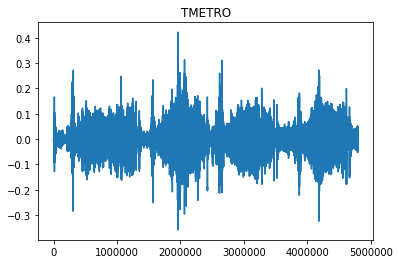

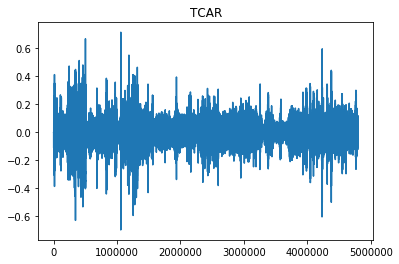

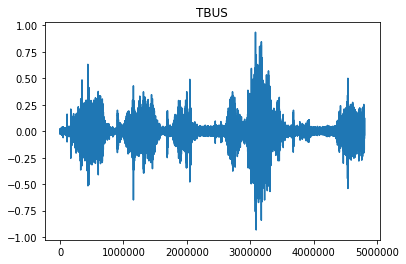

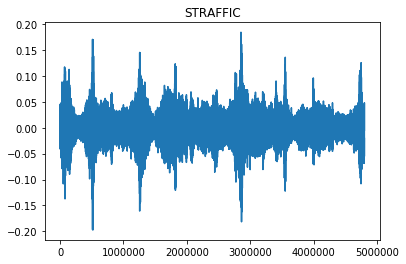

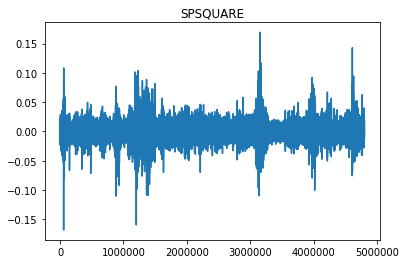

...

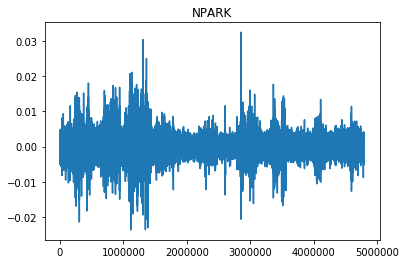

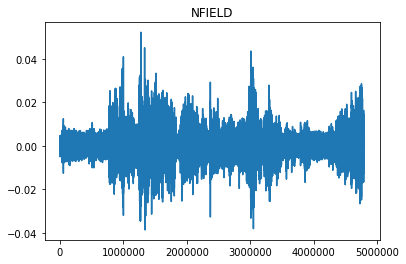

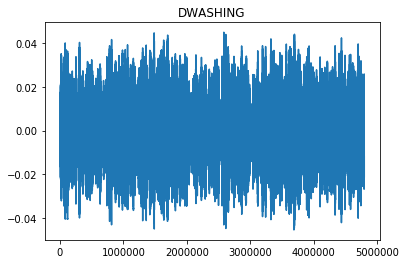

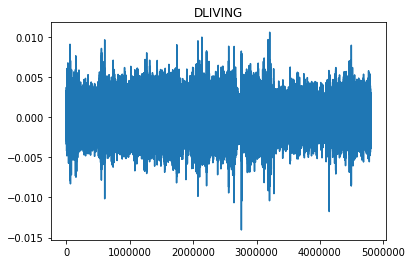

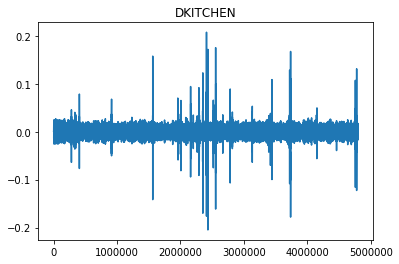

In [3]:
### Plot the wav files
for n in range(len(noisefolder)):
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    x, _ = lr.load(noisefile, sr)
    plt.plot(x), plt.title(noisefolder[n]), plt.show()
#     print(noisefile)


In [4]:
### Listen to a particular audio file
n = 16
print(noisefolder[n])
noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
x, _ = lr.load(noisefile, sr)
ipd.Audio(x, rate=sr)

DLIVING


n_frag: 2342


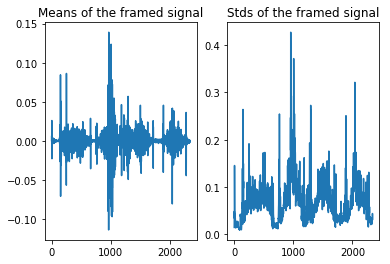

n_frag: 2342


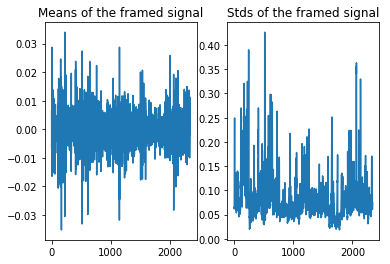

n_frag: 2342


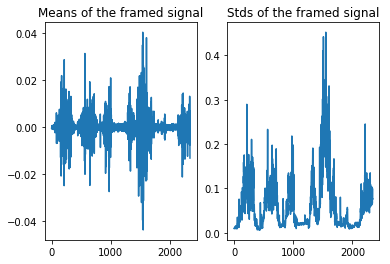

n_frag: 2342


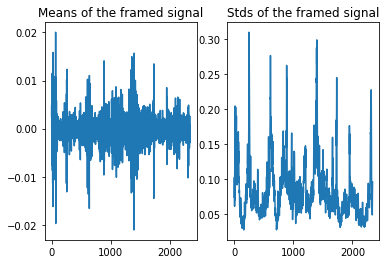

n_frag: 2342


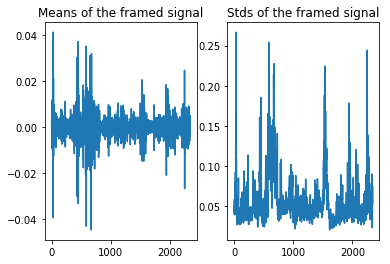

n_frag: 2342


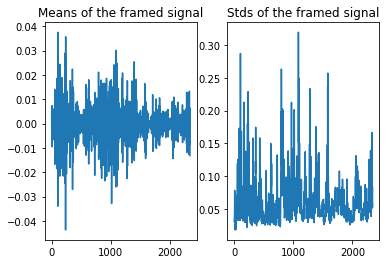

n_frag: 2342


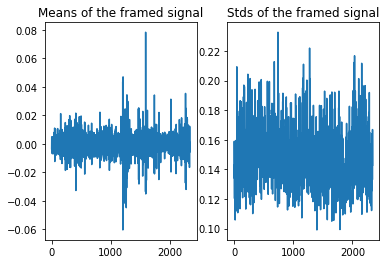

n_frag: 2342


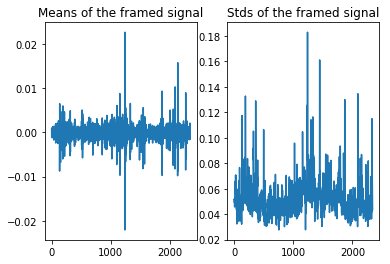

n_frag: 2342


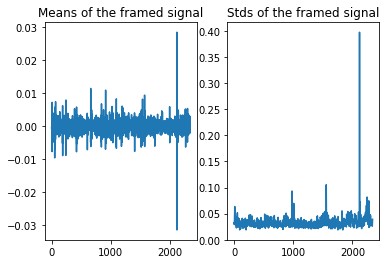

n_frag: 2342


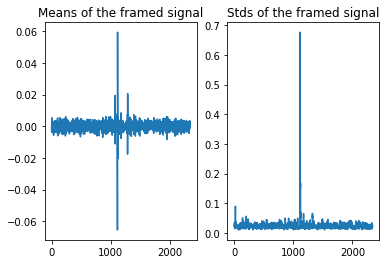

n_frag: 2342


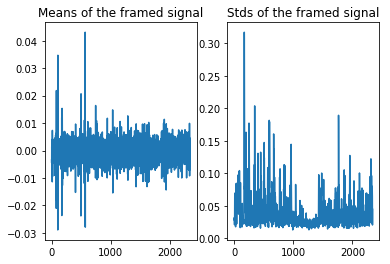

n_frag: 2342


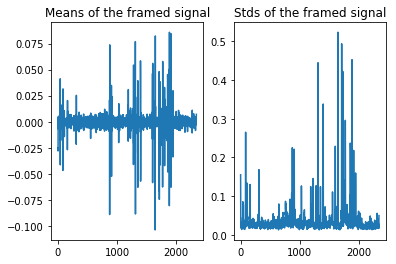

n_frag: 2342


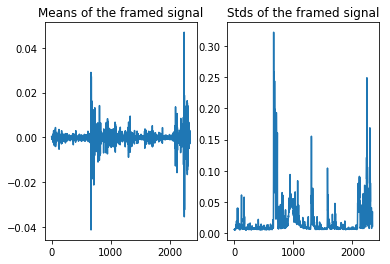

n_frag: 2342


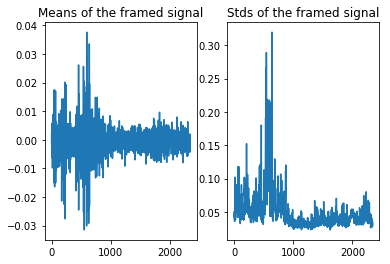

n_frag: 2342


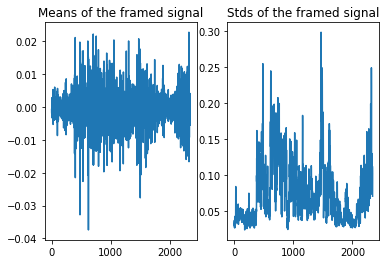

n_frag: 2342


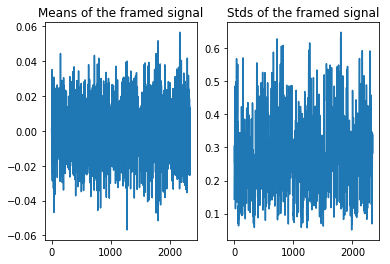

n_frag: 2342


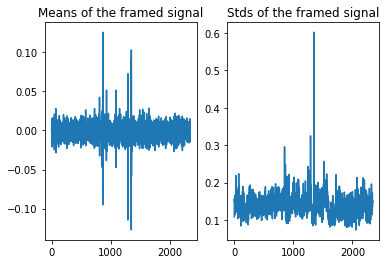

n_frag: 2342


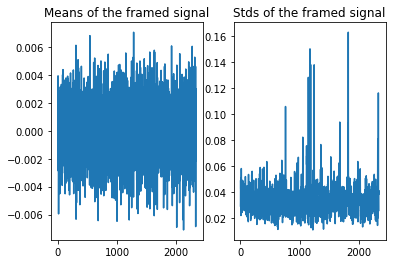

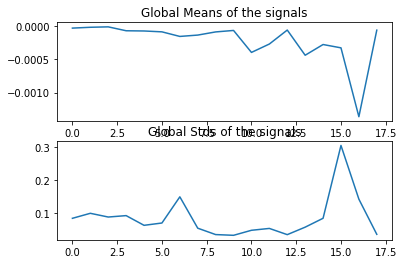

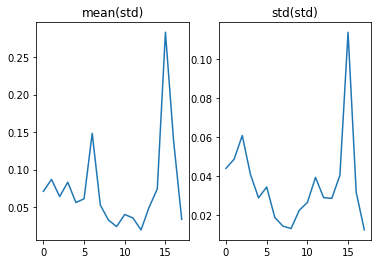

In [5]:
### Calculate statistics on the amplitude of the speech signals

maxes = np.zeros((len(noisefolder)))

mean_g = np.zeros((len(noisefolder)))
std_g = np.zeros((len(noisefolder)))
std_l_mean = np.zeros((len(noisefolder)))
std_l_std = np.zeros((len(noisefolder)))

for n in range(len(noisefolder)): #1):#
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    y, _ = lr.load(noisefile, sr)
    maxes[n] = np.max(y)
    x = y/maxes[n]

    # Calculate statistics of the signal
    mean_g[n] = x.mean()
    std_g[n] = x.std()
    #print(mean_g[n], std_g[n])

    n_frag = 1 + np.int((len(x)-win_size)/hop_size)
    print('n_frag: {}'.format(n_frag))
    
    mean_l = np.zeros((n_frag))
    std_l = np.zeros((n_frag))
    
    ind = 0
    for f in range(n_frag):
        #print(ind)
        # Calculate statistics on frames of the signal
        mean_l[f] = x[ind: ind+win_size].mean()
        std_l[f] = x[ind: ind+win_size].std()
        ind += hop_size

    plt.subplot(1,2,1), plt.plot(mean_l), plt.title('Means of the framed signal')
    plt.subplot(1,2,2), plt.plot(std_l), plt.title('Stds of the framed signal')
    plt.show()
    
    # Calculate statistics on the variance of the signal
    std_l_mean[n] = std_l.mean()
    std_l_std[n] = std_l.std()
#     print('mean(std): {}, std(std): {}'.format( std_l_mean[n], std_l_std[n]))
    
    
plt.subplot(2,1,1), plt.plot(mean_g), plt.title('Global Means of the signals')
plt.subplot(2,1,2),plt.plot(std_g), plt.title('Global Stds of the signals')
plt.show()

plt.subplot(1,2,1), plt.plot(std_l_mean), plt.title('mean(std)')
plt.subplot(1,2,2), plt.plot(std_l_std), plt.title('std(std)')
plt.show()


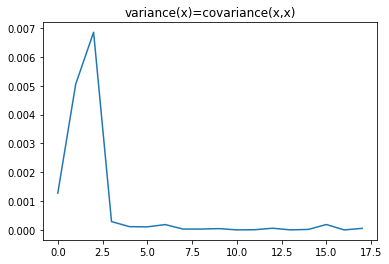

([<matplotlib.lines.Line2D at 0x7f039536d198>],
 Text(0.5, 1.0, 'variance(x)=covariance(x,x)'),
 None)

In [6]:
### COVARIANCE ANALYSIS

covs = np.zeros((len(noisefolder)))
for n in range(len(noisefolder)): #1):#
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    y, _ = lr.load(noisefile, sr)
    covs[n] = np.cov(y)
plt.plot(covs), plt.title('variance(x)=covariance(x,x)'), plt.show(), 


In [7]:
### Analysis of central gravity centers

[ 346.34117031 5111.29968797]
[  72.90617612 1805.40986043]
[ 216.81703693 5863.93869621]
[ 694.30792463 5039.7560468 ]
[ 319.83907383 5059.01899556]
[ 319.84619012 4735.02413405]
[1273.69681931 4882.16411278]
[1556.5727225  5981.85796045]
[ 476.81110099 5214.44427797]
[ 173.62907275 4878.93851264]
[ 892.20372972 6841.23099981]
[ 181.47410108 4654.22026036]
[ 322.38690493 3544.06898353]
[ 772.53226598 6235.81981127]
[ 310.35551359 3592.61526122]
[ 279.83469827 3558.02207633]
[ 517.43708747 5916.11408375]
[1622.39457019 7124.17274759]


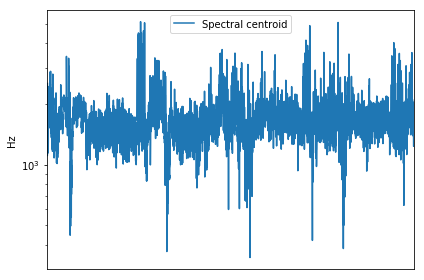

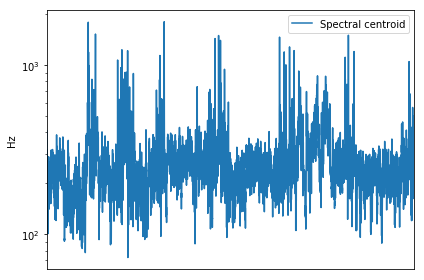

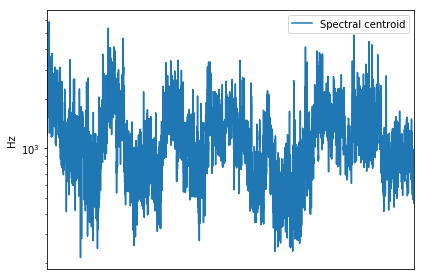

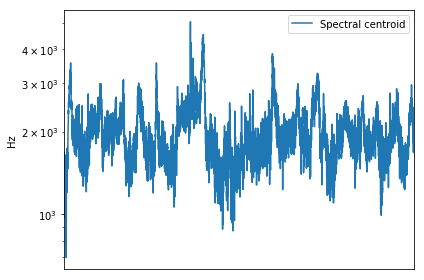

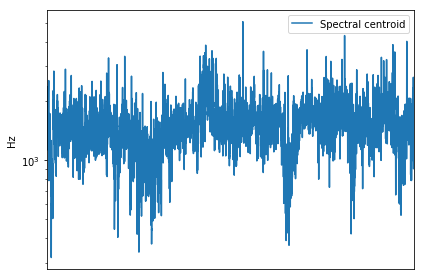

...

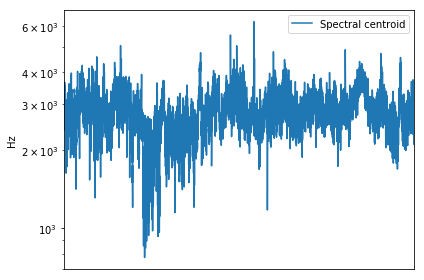

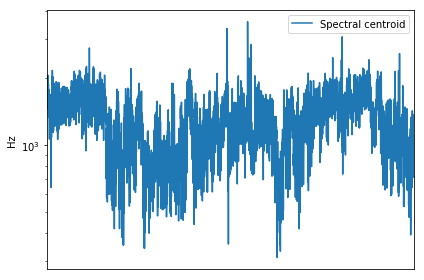

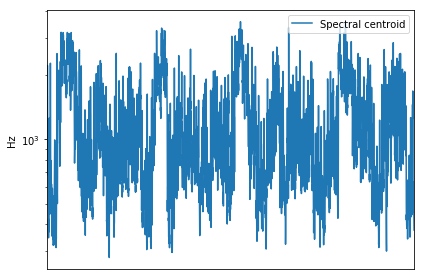

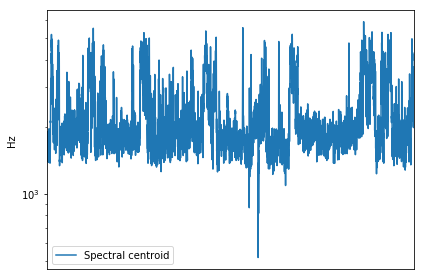

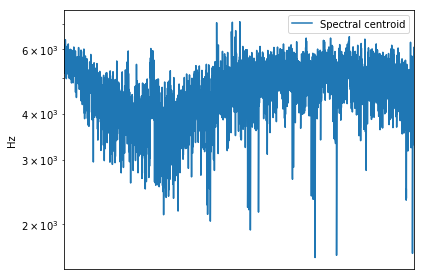

In [37]:
grav_amp = np.zeros((len(noisefolder),2))
grav_std = np.zeros((len(noisefolder),1))
grav_mean = np.zeros((len(noisefolder),1))
for n in range(len(noisefolder)): # 1):#
    # Loading
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    y, _ = lr.load(noisefile, sr)
    
    # Calculate frequency bins
    if_gram, D = lr.ifgram(y)
    spec_grav_cent= lr.feature.spectral_centroid(y, sr, freq=if_gram)
    
    # Calculate spectrograms
    #S, phase = lr.magphase(lr.stft(y=y))
    #librosa.feature.spectral_centroid(S=S)

    # Plots 
    plt.figure()
#     plt.subplot(2, 1, 1)
    plt.semilogy(spec_grav_cent.T, label='Spectral centroid')
    plt.ylabel('Hz')
    plt.xticks([])
    plt.xlim([0, spec_grav_cent.shape[-1]])
    plt.legend()
#     plt.subplot(2, 1, 2)
#     lrd.specshow(lr.amplitude_to_db(S, ref=np.max),y_axis='log', x_axis='time')
#     plt.title('log Power spectrogram')
    plt.tight_layout()
    
    # Calculate statistics and features: amplitude - means - variance
    grav_amp[n,] = [np.min(spec_grav_cent), np.max(spec_grav_cent)]
    print(grav_amp[n,])
    grav_mean[n] = np.mean(spec_grav_cent)
    grav_std[n] = np.std(spec_grav_cent)
    

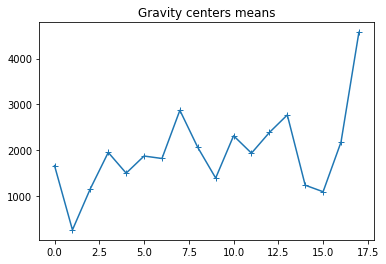

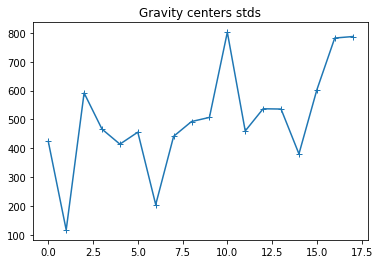

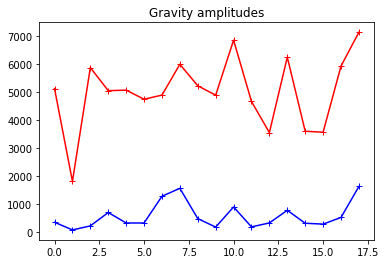

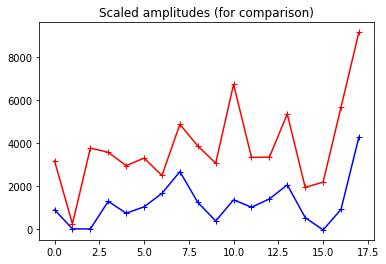

In [45]:
plt.plot(grav_mean,'-+'), plt.title('Gravity centers'' means'), plt.show()
plt.plot(grav_std,'-+'), plt.title('Gravity centers'' stds'),plt.show()

grav_amp0=grav_amp[:,0][:, np.newaxis]
grav_amp1=grav_amp[:,1][:, np.newaxis]

plt.plot(grav_amp0,'b-+'), plt.plot(grav_amp1,'r-+'), plt.title('Gravity amplitudes'), plt.show()


mean_mean = np.mean(grav_mean)
std_mean = np.std(grav_mean)

plt.plot((grav_amp0-mean_mean)/std_mean * grav_std + grav_mean,'b-+'),  
plt.plot((grav_amp1-mean_mean)/std_mean * grav_std + grav_mean,'r-+'),  plt.title('Scaled amplitudes (for comparison)'),
plt.show()

